# 21M.359 Fundamentals of Music Processing
## Pset5

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
from ipywidgets import interact
import math
import sys
sys.path.append("../common")
from util import *
import fmp

%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 3)

## Exercise 1

Load the audio below and create the Spectral Novelty Funciton using these parameters:

$N = 1024$  
$H = 512$  
$\gamma = 100$

You should use the provided function `fmp.spectral_novelty`. Just pass in the right arguments.

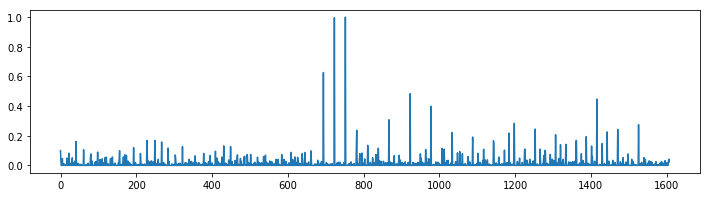

In [6]:
snd = load_wav("audio/beatles_lucy_excerpt.wav")
sr = 22050

# answer
N = 1024
H = 512
g = 100

specNovelty = fmp.spectral_novelty(snd, N, H, g)

plt.figure()
plt.plot(specNovelty)

Create $\mathcal{F}(n, k)$, the tempogram from this novelty curve using the parameters:

$N_{tg} = 256$  
$H_{tg} = 16$  
$Z_{tg} = 16$  

Use `fmp.stft` with the `centered=False` option for the STFT. This will be important later on.

Plot this tempogram.

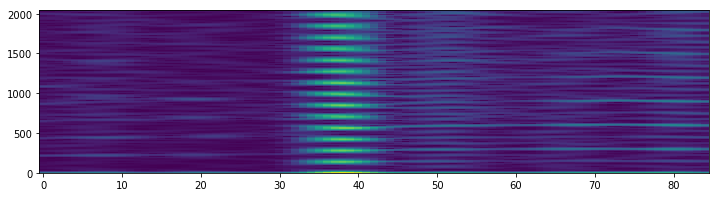

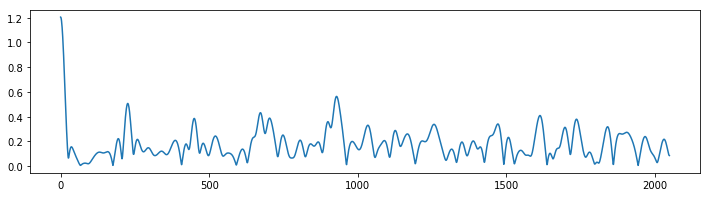

In [7]:
# answer
# def createTempogram(spectralNovelty, N, H, Z):
#     F = np.zeros()
Ntg = 256
Htg = 16
Ztg = 16
tempoGram = fmp.stft(specNovelty, Ntg, Htg, Ztg, centered=False)
plt.figure()

plt.imshow(abs(tempoGram), origin='lower', interpolation='nearest', aspect='auto')
plt.figure()
plt.plot(abs(tempoGram[:,15]))

## Exercise 2

We now have three time series:
- The original audio recording $x(n)$
- The novelty function $\Delta(n)$
- The tempogram $\mathcal{F}(n, k)$

Each has a different sampling rate. It is important to keep these in mind to avoid confusion later on.

1. What are the sampling rates for each of the above signals?
- For the tempogram $\mathcal{F}(n, k)$, what value of $k$ corresponds to 60 BPM?
- What tempo (in BPM) does $k=100$ represent?


In [8]:
# answer
print "1. Sampling Rates"
print "Audio", sr
fr_novelty = sr/float(H)
fr_tempogram = fr_novelty/Htg

print "Novelty", fr_novelty
print "Tempogram", fr_tempogram

def bpmToK(bpm, fr, N):
    return bpm / 60.0 * N/fr
def kToBpm(k, fr, N):
    return k * float(fr) / N * 60
print "2. K =", bpmToK(60, fr_novelty, Ntg * Ztg)
print "3. BPM =", kToBpm(100, fr_novelty, Ntg * Ztg)



1. Sampling Rates
Audio 22050
Novelty 43.06640625
Tempogram 2.69165039062
2. K = 95.1089342404
3. BPM = 63.0855560303


## Exercise 3

Write a function that returns the index ($k$) of the most likely tempo for each time slot in a Fourier tempogram. However, instead of just returning the column-wise maximum, find the best tempo estimate from within a given tempo range.

The steps are:
- Convert the BPMs into frequency bins ($k$'s)
- Set all values of the tempogram to 0 that are below the low bpm frequency or above the high bpm frequency.
- Take the column-wise maximum.

Hint: careful not to modify the original tempogram in your function. Make a copy if you want to modify it.

In [9]:
def best_tempogram_bins(tg, fr, bmp_low, bmp_high):
    tgBest = tg.copy()
    (K, T) = tgBest.shape
    print (T, K)
    kLow = int(math.ceil(bpmToK(bmp_low, fr, Ntg * Ztg)))
    kHigh = min(int(math.floor(bpmToK(bmp_high, fr, Ntg * Ztg))), K) 
    print kLow
    print kHigh
    tgBest[:kLow + 1, :] = np.zeros((kLow + 1, T))
    
    tgBest[kHigh:, :] = np.zeros((K - kHigh, T))
    
#     print tgBest
#     plt.figure()
#     plt.imshow(abs(tgBest), origin='lower', interpolation='nearest', aspect='auto')
    bestKs = np.argmax(tgBest, axis=0)
    return bestKs
    
    


Now test your function with the spectral novelty you created above using a BPM range of $[30-250]$.

In a single figure:
- plot the tempogram, but only in the subrange $k = [0 - 400]$
- plot the best tempo estimates as red dots [Hint: use `'ro'`]


(85, 2049)
48
396
[211 208 230 227 223 219 215 211 207 233 230 225 222 218 216 238 236 233
 230 227 223 220 216 244 241 239 236 234 231 229 228 290 292 147 137 277
 279 282 285 288 146 129 150 135 152 140 283 287 291 295 299 304 139 283
 287 292 297 302 306 311 289 293 298 302 307 312 289 294 299 304 309 314
 291 296 300 305 309 288 292 296 301 306 312 285 290]


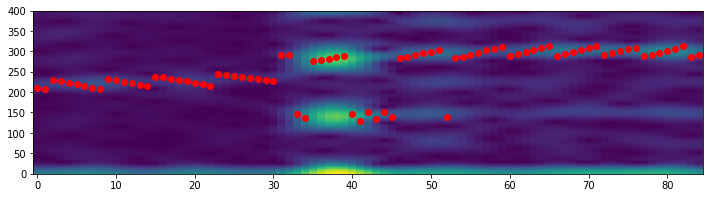

In [10]:
# answer
plt.figure()
plt.imshow(abs(tempoGram)[0:400, :], origin='lower', interpolation='nearest', aspect='auto')
bestKs = best_tempogram_bins(tempoGram, fr_novelty, 30, 250)
print bestKs
plt.plot(bestKs, 'ro')



## Exercise 4

Using the bins from above, which represent the most likely tempo values per time slot, find the sinusoid parameters that best match the underlying beat structure. These parameters will be used to recreate a PLP (Predominant Local Pulse) in the next Exercise.

Write the function `get_sinusoid_params` below to return the set of frequencies and phases associated with the given bins of the spectrogram (ie, the Fourier tempogram).

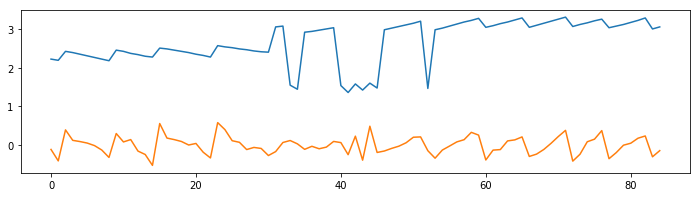

In [11]:
def get_sinusoid_params(spec, sr, bins, fftSize):
    (K, T) = spec.shape
    coeffs = spec[bins, np.arange(T)]
    
    mags = np.abs(coeffs)
    phases = np.angle(coeffs)
    freqs = bins/float(fftSize) * sr
    return freqs, phases


freqs, phases = get_sinusoid_params(tempoGram, fr_novelty, bestKs, Ntg * Ztg)



plt.figure()
plt.plot(freqs)
plt.plot(phases);

## Exercise 5

The final step in creating the PLP - aka $\Gamma(n)$ - is to go through each frequency / phase pair, generate a windowed sinusoid, and then add up all these sinusoid together. The trick is to place the generated sinusoid at the proper location in time.

The sampling rate of the PLP should be the same as $F_f$, the feature rate for the novelty function $\Delta(n)$.

Each windowed sinusoid is:
$\cos(2\pi f n / F_f + \phi) \cdot w(n)$  
$f$ and $\phi$ are provided by `get_sinusoid_params()`.  
$w(n)$ is the Hann window, whose length is exactly $L = N_{tg}$, the length of the window used by the STFT to create the tempogram.

Each windowed sinusoid must then be added to the correct location of $\Gamma(n)$. [Hint, you will need to use the tempogram hop-size $H_{tg}$.

As a final step, half-wave-rectify the entire PLP signal and then return it.

In [12]:
def make_plp(freqs, phases, nov_fr, tg_win_len, tg_hop):
    numHops = len(freqs)
    
    numSamples = tg_win_len + tg_hop * (numHops - 1)
    PLP = np.zeros(numSamples)

    for h in range(0, numHops):
        f = freqs[h]
        p = phases[h]
        
        ns = np.arange(0, tg_win_len)
        windowed = np.cos(2*math.pi*f*ns/nov_fr + p) * np.hanning(tg_win_len)
        half_rectified = windowed.clip(min=0)
        
        PLP[h*tg_hop:h*tg_hop + tg_win_len] = PLP[h*tg_hop:h*tg_hop + tg_win_len] + half_rectified
        
    return PLP    
    
    
    

- Plot $\Delta(n)$, the Novelty Function, and $\Gamma(n)$, the PLP.
- Listen to the clicks generated by picking all the peaks of the PLP.

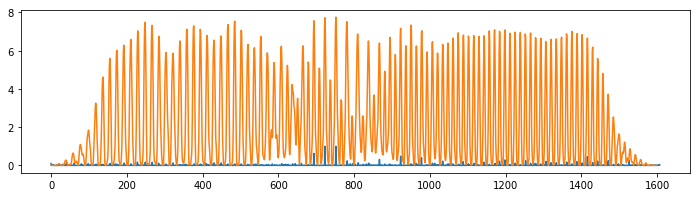

In [13]:
plp = make_plp(freqs, phases, fr_novelty, Ntg, Htg)

plt.plot(specNovelty)
plt.plot(plp)

peaks = find_peaks(plp, 0)
def listen_to_clicks(beats, snd) :
    click_snd = load_wav('audio/click.wav')
    clicks = fmp.make_clicks(beats, len(snd), click_snd)
    return ipd.Audio((clicks, snd), rate = 22050)

listen_to_clicks(peaks * H, snd * .5)
# ipd.Audio(snd, rate = 22050)


## Exercise 6a


A more sophisticated method of creating a Spectral Novelty Function is to use weighted frequency bands.

Recall that the process for creating the Spectral Novelty Function for $x(n)$ is:
1. Create the magnitude STFT.
- Apply logarithmic compression.
- Differentiate each frequency band.
- Half-wave-rectify
- Accumulate all columns.
- Enhance the function by subtracting the local average
- Half-wave-rectify
- Normalize

In this exercise, you will follow the above steps, but only for a subrange of the full spectrum.

To help you get started, below is the regular spectral novelty function:

In [14]:
def spectral_novelty(x, fft_len, hop_size, gamma):
    # log spectrogram
    spec = fmp.stft_mag(x, fft_len, hop_size)
    log_spec = np.log10(1 + gamma * spec)
    
    # differentate, hwr, accumulate
    dls = log_spec[:, 1:] - log_spec[:, :-1]
    dls[dls < 0] = 0
    spec_nov = np.sum(dls, axis = 0)
    
    # subtract local average
    ave_len = 9
    win = np.hanning(ave_len) / np.sum(np.hanning(ave_len))
    loc_ave = np.convolve(spec_nov, win, mode='same') * 1.02
    spec_nov = spec_nov - loc_ave
    
    # hwr, normalize
    spec_nov[spec_nov < 0] = 0
    spec_nov /= np.max(spec_nov)

    return spec_nov


Modify the above function to operate on a frequency subrange of the full spectrogram. In other words, the above steps should only apply to a defined frequency band, from `freq_start` to `freq_end`.

In [15]:
def subband_novelty(x, fft_len, hop_size, gamma, sr, freq_start, freq_end):
    
    def freqToBin(f):
        #f = k * sr/fft_len
        #k = f/sr*fft_len
        return float(f)/sr*fft_len
    # log spectrogram
    full_spec = fmp.stft_mag(x, fft_len, hop_size)
    
    kStart = int(freqToBin(freq_start))
    kEnd = int(freqToBin(freq_end))
    spec = full_spec[kStart:kEnd, :]
    
    
    log_spec = np.log10(1 + gamma * spec)
    
    
    # differentate, hwr, accumulate
    dls = log_spec[:, 1:] - log_spec[:, :-1]
    dls[dls < 0] = 0
    spec_nov = np.sum(dls, axis = 0)
    
    # subtract local average
    ave_len = 9
    win = np.hanning(ave_len) / np.sum(np.hanning(ave_len))
    loc_ave = np.convolve(spec_nov, win, mode='same') * 1.02
    spec_nov = spec_nov - loc_ave
    
    # hwr, normalize
    spec_nov[spec_nov < 0] = 0
    spec_nov /= np.max(spec_nov)

    return spec_nov

Test this function by using the audio snippet below.

In [16]:
snd = load_wav("audio/wonder_superstition.wav", 0, 10)
ipd.Audio(snd, rate=sr)


## Exercise 6b

Create two novelty functions, one with a spectral range of 0-250Hz, and one with a spectral range of 4000-8000Hz, using parameters:  
$N = 1024$  
$H = 512$  
$\gamma = 100$

Plot these two novelty curves.

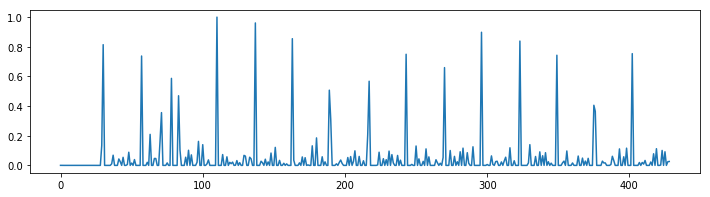

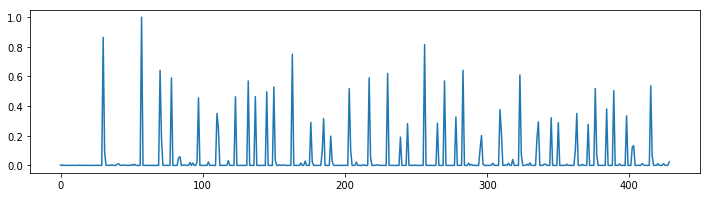

In [17]:
# answer
N2 = 1024
H2 = 512
GAMMA2 = 100

sub1 = subband_novelty(snd, N2, H2 , GAMMA2, sr, 0, 250)
sub2 = subband_novelty(snd, N2, H2 , GAMMA2, sr, 4000, 8000)
sub3 = subband_novelty(snd, N2, H2 , GAMMA2, sr, 0, 16000)
full = spectral_novelty(snd, N2, H2, GAMMA2)

plt.figure()
plt.plot(sub1)
plt.figure()
plt.plot(sub2)
# plt.figure()
# plt.plot(full)



peaks = find_peaks(plp, 0)



## Exercise 6c

Describe your observations of the above experiment based on listening to the audio and observing the plots.

Answer:
In the 0-250HZ band, we are isolating the kick drum, so we get these large widely spaced peaks corresponding to the kicks (as well as some more noise due to there not being much low frequencies in inbetween the kicks). 

In the 4000-8000Hz range we are capturing the higher range sounds, such as the cymbals, so we get more frequent peaks



## Exercise 7

Replicate the Dynamic Programming for Beat Detection algorithm on the following "toy" problem.

The novelty function $\Delta(n) = [1,0,5,2,0,3,6,1,0,5,2]$.  
The estimated beat period $\hat \delta = 3$  
The penalty function $P_{\hat \delta}(\delta) = - (\delta - \hat \delta)^2$  
The adjustment constant  $\lambda = 1$  

- Compute the accumulated score vector $\mathbf{D}(n)$.
- As you do that, create the backtracking vector $\mathbf{P}(n)$.
- Finally, follow the pointers of $\mathbf{P}(n)$ from $n = \text{argmax}(\mathbf{P}(n))$ to $n=0$ to create the list of beat locations. 


In [18]:
# answer
def DPBeat(novelty, beatPeriod, penalty, adjustment):
    N = len(novelty) + 1
    
    DP = np.zeros(N)
    B = np.zeros(N)
    DP[0] = 0
    B[0] = -1
    
    for n in range(1, N):
        penalties = map(lambda m: DP[m] + adjustment * penalty(beatPeriod, n - m), np.arange(n))
        bestPenalty = max(np.max(penalties), 0)
        parent = np.argmax(penalties)
        
        B[n] = parent
        DP[n] = bestPenalty + novelty[n-1]
        
    
    return DP, B
#         for nPrev in range(0, n):
            
novelty = [1,0,5,2,0,3,6,1,0,5,2]
beatPeriod = 3
def penalty(beatPeriod, beatDist):
    return -(beatPeriod - beatDist)**2
adjustment = 1
DP, B = DPBeat(novelty, beatPeriod, penalty, adjustment)
    
bestStart = np.argmax(DP)
def backTrack(B, bestStart):
    i = int(bestStart)
    path = []
    while B[i] != -1:
        path.append(int(i))
        i = int(B[i])
    return list(reversed(path))

beatLocs = backTrack(B, bestStart)

print "D =",DP[1:]
print "P =",B[1:]
print "Beat locations =", beatLocs, "(one indexed)"


D = [  1.   0.   5.   3.   4.   8.  10.   8.   9.  15.  13.]
P = [  0.   0.   0.   1.   3.   3.   3.   6.   7.   7.  10.]
Beat locations = [3, 7, 10] (one indexed)


## Exercise 8

One of the inputs to the dynamic programming algorithm is an estimated tempo (or rather, an estimated _beat period_). Write the function `find_beat_period` that estimates the beat period given the novelty function $\Delta(n)$ using an auto-correlation tempogram.

Your approach should be:
- Create an auto-correlation tempogram with a 4x upsampled novelty function (like we did in lab).
- Find the average autocorrelation by averaging across all rows.
- Find lag values correspond to `bpm_low` and `bpm_high`
- Find the index corresponding to the maximum value of the average autocorrelation function within that lag range.
- Use this lag value to compute the _beat period_ in units of $F_f$ the same sampling rate of $\Delta(n)$


In [49]:
def auto_correlate(x) :
    L = len(x)
    rxx = np.zeros(L)

    for l in range(0, L):
        rxx[l] = np.dot(x[l:],x[:L-l]) #x(n) dot x(n+l), which is equivalent

#         rxx.append(np.dot(x, np.append(x[l:], np.zeros(l)))) #x(n) dot x(n+l), which is equivalent
    return rxx

def bpmToLag(bpm, fr):
    #beat/min * min/s * s/feature = beat/feature
    #lag denotes features/beat
    return int(fr * 60.0/bpm)
    
def lagToBpm(lag, fr):
    return fr * 60.0/lag

import scipy.signal


def find_beat_period(nov, fr, bpm_low, bpm_high):
    upSampleRate = 4
    upNov = scipy.signal.resample_poly(nov, upSampleRate, 1)
    
    N = len(upNov)
#     print N
    L = 500
    H = 8
    
    numHops = (N - L)/H + 1
    tg = np.zeros((L, numHops))
    
    for h in range(0, numHops):
        start = h * H
        window = upNov[start:start+L]
        tg[:, h] = auto_correlate(window)
#     plt.figure()
#     plt.imshow(tg, origin='lower', interpolation='nearest', aspect='auto')
        
    averages = np.mean(tg, axis=1)
#     plt.figure()
#     plt.plot(averages)
    
    lagLow = bpmToLag(bpm_high, fr*upSampleRate)
    lagHi = bpmToLag(bpm_low, fr*upSampleRate)
    
#     print averages.shape
#     print lagLow
#     print lagHi
    
    averages[0:lagLow] = np.zeros(lagLow)
    averages[lagHi:L] = np.zeros(L - lagHi)
    
    
    
    bestLag = float(np.argmax(averages))/upSampleRate
    
    return bestLag








In [56]:
def beatDetect(fileName, alpha = 0.7, fft_len = 2048, hop_size = 512):
    snd = load_wav(fileName,0, 30)
    sr = 22050.
    fft_len = 2048
    hop_size = 512
    nov = fmp.spectral_novelty(snd, fft_len, hop_size, 10)
    fr = sr/float(hop_size)
    # specNovelty = fmp.spectral_novelty(snd, N, H, g)
#     plt.plot(nov[500:1500])
#     ipd.Audio(snd, rate=sr)
    
    est_period = find_beat_period(nov, fr, 60, 150)
#     beats = fmp.create_dp_beats(nov, int(round(est_period)), lmda = 5.)

    nov1 = subband_novelty(snd, fft_len, hop_size, 10, sr, 0, 250)
    nov2 = subband_novelty(snd, fft_len, hop_size, 10, sr, 4000, 8000)
    
    novWeighted = a * nov1 + (1-a) * nov2 
    beats = fmp.create_dp_beats(novWeighted, int(round(est_period)), lmda = 5.)
    return (beats/fr, lagToBpm(est_period, fr))   

Test your function on the song below with the parameters shown and print the estimated period

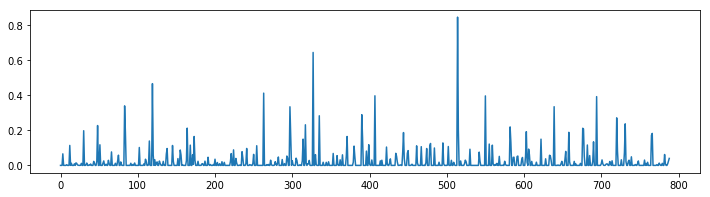

In [57]:
snd = load_wav("audio/snow.wav", 0, 30)
sr = 22050.
fft_len = 2048
hop_size = 512
nov = fmp.spectral_novelty(snd, fft_len, hop_size, 10)
fr = sr/float(hop_size)
# specNovelty = fmp.spectral_novelty(snd, N, H, g)

plt.plot(nov[500:1500])
ipd.Audio(snd, rate=sr)

In [58]:
detectedBeats = beatDetect('audio/snow.wav')

In [59]:
detectedBeats

(array([  0.23219955,   1.04489796,   1.88081633,   2.71673469,
          3.55265306,   4.38857143,   5.15482993,   6.06040816,
          6.87310658,   7.70902494,   8.56816327,   9.38086168,
         10.21678005,  10.98303855,  11.88861678,  12.72453515,
         13.56045351,  14.37315193,  15.23229025,  16.06820862,
         16.81124717,  17.7168254 ,  18.52952381,  19.38866213,
         20.2245805 ,  21.06049887,  21.89641723,  22.7323356 ,
         23.54503401,  24.38095238,  25.19365079,  26.05278912,
         26.91192744,  27.72462585,  28.51410431,  29.37324263]), 71.77734375)

In [64]:

est_period = find_beat_period(nov, fr, 60, 150)


## Exercise 9

Now that you have an estimated period, use it as a parameter to the dynamic beat tracking function below.

The estimated period should be 26.25.


In [33]:
beats = fmp.create_dp_beats(nov, int(round(est_period)), lmda = 5.)
listen_to_clicks(beats * hop_size, snd * .5)

Notice how the click track starts fine, but then latches onto the offbeat. The problem is that there is a very strong offbeat hit on the high hat. To counteract this effect, we can use the `subband_novelty()` function from Exercise 6 to create a novelty function with higher emphasis on the bass.

Create a novelty function that is a weighted sum of two band-limited novelty functions:
- $\Delta_1(n)$ with a frequency range of $0:250$Hz
- $\Delta_2(n)$ with a frequency range of $4000:8000$Hz
- $\Delta(n) = a \cdot \Delta_1(n) + (1-a) \cdot \Delta_2(n) $ where $a \in [0,1]$.

Run this novelty function through the beat tracking algorithm and try out different values of $a$. 

What kind of behaviors do you see with different values of $a$? Which value of $a$ seems to work well?

In [34]:
nov1 = subband_novelty(snd, fft_len, hop_size, 10, sr, 0, 250)
nov2 = subband_novelty(snd, fft_len, hop_size, 10, sr, 4000, 8000)

a = 0.7
novWeighted = a * nov1 + (1-a) * nov2 

beats2 = fmp.create_dp_beats(novWeighted, int(round(est_period)), lmda = 5.)

listen_to_clicks(beats2 * hop_size, snd * .5)

# nov1 = subband_novelty(...)
# nov2 = subband_novelty(...)



Answer:
If a = 0.0, the beat is consistently on the off beat. If a = 1.0, the beat is consistently on the on beat. Since the kick is usually on the downbeat, the lower freq in this case is a more reliable measure to base beat detection off of. Any a > 0.3 seems to work fine. Overall, the beat detector seems to be slightly ahead of the beat.